In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_masks.npy')

In [3]:
images.shape

(11990, 512, 512, 1)

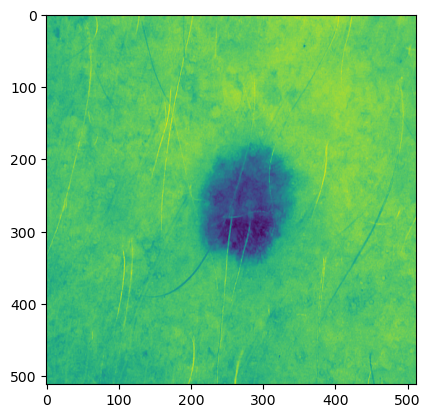

In [4]:
imshow(images[1001])

In [5]:
masks.shape

(11990, 512, 512, 1)

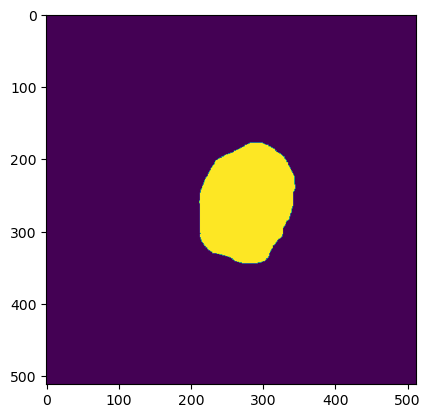

In [6]:
imshow(masks[1001])

In [11]:
import sys
sys.path.append('../')
import gp2

In [12]:
from keras import losses

In [13]:
loss_fx = losses.BCE

In [14]:
C = gp2.KUC_UNet2D(loss=loss_fx)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmp13gi8le1kuc_unet2d


In [15]:
hist = C.train(images[0:9690], masks[0:9690], images[9690:11990], masks[9690:11990], batch_size=16, patience_counter=2)

Epoch 1/100
606/606 [==============================] - 186s 284ms/step - loss: 0.5363 - dice_coeff: 0.4994 - val_loss: 0.3922 - val_dice_coeff: 0.5892
Epoch 2/100
606/606 [==============================] - 164s 271ms/step - loss: 0.4095 - dice_coeff: 0.5637 - val_loss: 0.3132 - val_dice_coeff: 0.6348
Epoch 3/100
606/606 [==============================] - 164s 271ms/step - loss: 0.3505 - dice_coeff: 0.6385 - val_loss: 0.2442 - val_dice_coeff: 0.7367
Epoch 4/100
606/606 [==============================] - 164s 271ms/step - loss: 0.2990 - dice_coeff: 0.7009 - val_loss: 0.2006 - val_dice_coeff: 0.7694
Epoch 5/100
606/606 [==============================] - 164s 271ms/step - loss: 0.2592 - dice_coeff: 0.7438 - val_loss: 0.1600 - val_dice_coeff: 0.8247
Epoch 6/100
606/606 [==============================] - 164s 271ms/step - loss: 0.2169 - dice_coeff: 0.7846 - val_loss: 0.1636 - val_dice_coeff: 0.8034
Epoch 7/100
606/606 [==============================] - 164s 271ms/step - loss: 0.1934 - dice_c

In [16]:
def visualize_predictions(model, images, masks, num_samples=100):
    for i in range(num_samples):
        x_val, y_val = images[i], masks[i]
        y_pred, _ = model.predict(x_val[np.newaxis, ...], y_val[np.newaxis, ...])

        # Draw the input image, true mask, and predicted mask
        fig, ax = plt.subplots(nrows=1, ncols=3)
        
        ax[0].imshow(x_val)
        ax[0].title.set_text('Input Image')

        ax[1].imshow(y_val.squeeze(), cmap='gray')
        ax[1].title.set_text('True Mask')

        ax[2].imshow(y_pred.squeeze(), cmap='gray')
        ax[2].title.set_text('Predicted Mask')

        plt.show()

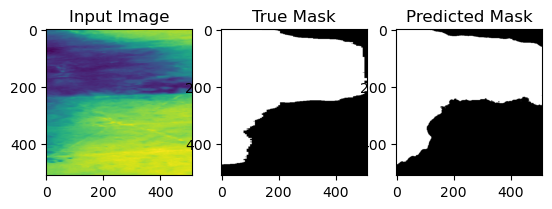

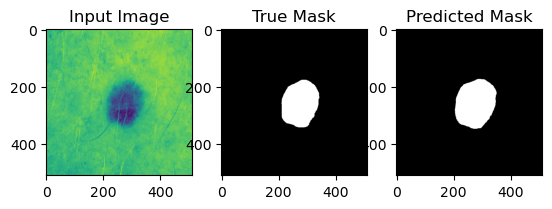

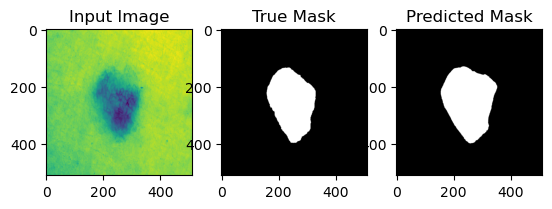

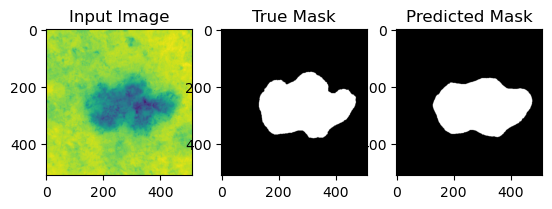

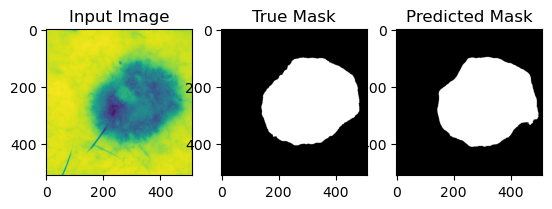

...

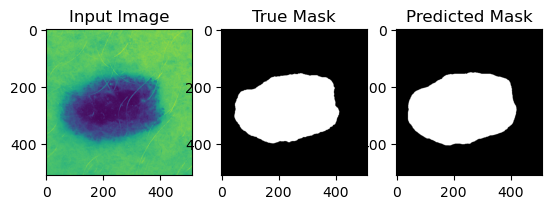

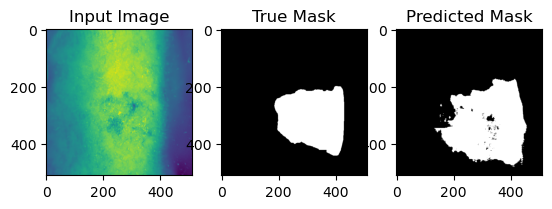

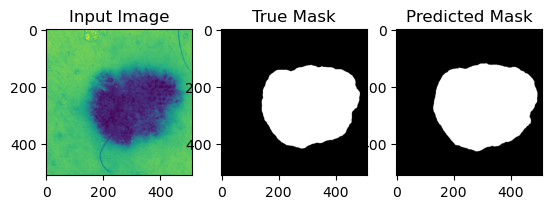

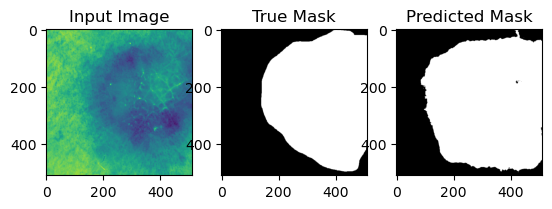

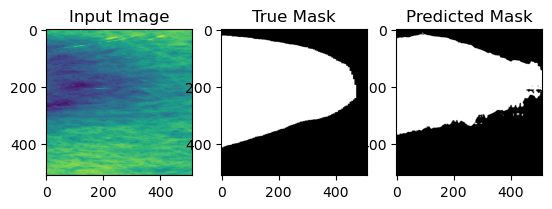

In [17]:
visualize_predictions(C, images[1000:1500], masks[1000:1500], num_samples=200)